<a href="https://colab.research.google.com/github/Shalinid8/3D-anaglyph/blob/main/Shalini_Dhamodharan_Final1_Bonus.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install rembg
!% matplotlib inline

from rembg import remove
from PIL import Image
import cv2
import numpy as np
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow

In [ ]:
def img_detection(input_path,output_path):
  input = Image.open(input_path)
  output = remove(input)
  output.save(output_path)

In [ ]:
def image_filter():
  print("hello")

In [ ]:
def image_offset():
  print("hello")

In [ ]:
def image_outline(img,img2,front_offset, back_offset):
  Original_image = img2.copy()
  img_background =img2.copy()
  img_foreground =img2.copy()
  lower = np.array([5,5,5])
  higher = np.array([250,250,250])
  mask =cv2.inRange(img, lower, higher)
  cv2_imshow(img)



  cont2,_ =cv2.findContours(mask,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_NONE)
  # img2 = np.array(open_cv_image.getdata()).reshape(open_cv_image.size[0], open_cv_image.size[1], 3)
  cont_img2 =np.array(input)
  cont_img2 = cv2.drawContours(img2,cont2,-1,250,5)
  print(" The image segmentation and object Identification ")
  cv2_imshow(img2)


  gray_three = cv2.merge([mask,mask,mask])

  cv2_imshow(gray_three)
  cv2_imshow(mask)

  print(mask.shape,gray_three.shape )

  for r in range (len(gray_three)):
    for g in range (len(gray_three[0])):
      for b in range (len(gray_three[0][0])):
        if gray_three[r][g][b]== 255:
          img_background[r][g][b] = 255
  print("Image Background Seperation")
  cv2_imshow(img_background)

  for r in range (len(gray_three)):
    for g in range (len(gray_three[0])):
      for b in range (len(gray_three[0][0])):
        if gray_three[r][g][b]== 0:
          img_foreground[r][g][b] = 255
  print("Image Foreground Seperation")
  cv2_imshow(img_foreground)


  background_green = img_background.copy()
  # set blue and red channels to 0
  background_green[:, :, 0] = 0
  background_green[:, :, 2] = 0
  for r in range (len(gray_three)):
    for g in range (len(gray_three[0])):
      for b in range (len(gray_three[0][0])):
        if gray_three[r][g][b]== 255:
          background_green[r][g][b] = 0
  print("Image Background with green Filter")
  cv2_imshow(background_green)

  background_red = img_background.copy()
  # set blue and red channels to 0
  background_red[:, :, 0] = 0
  background_red[:, :, 1] = 0
  for r in range (len(gray_three)):
    for g in range (len(gray_three[0])):
      for b in range (len(gray_three[0][0])):
        if gray_three[r][g][b]== 255:
          background_red[r][g][b] = 0
  print("Image Background with red Filter")
  cv2_imshow(background_red)

  foreground_green = img_foreground.copy()
  # set blue and red channels to 0
  foreground_green[:, :, 0] = 0
  foreground_green[:, :, 2] = 0
  for r in range (len(gray_three)):
    for g in range (len(gray_three[0])):
      for b in range (len(gray_three[0][0])):
        if gray_three[r][g][b]!= 255:
          foreground_green[r][g][b] = 0
  print("Image Foreground with green Filter")
  cv2_imshow(foreground_green)

  foreground_red = img_foreground.copy()
  # set blue and red channels to 0
  foreground_red[:, :, 0] = 0
  foreground_red[:, :, 1] = 0
  for r in range (len(gray_three)):
    for g in range (len(gray_three[0])):
      for b in range (len(gray_three[0][0])):
        if gray_three[r][g][b]!= 255:
          foreground_red[r][g][b] = 0
  print("Image Foreground with red Filter")
  cv2_imshow(foreground_red)


  def red_green_filter(image,redshade, greenshade, offset):
    print("hello")




  print("Foreground region(object 1) green and red filters are overlapped and moved by "+str(front_offset)+" pixels")
  g_offset = r_offset = front_offset
  three_d_front = np.zeros((img.shape[0], img.shape[1]+r_offset+g_offset, img.shape[2]))
  three_d_front[:,r_offset+g_offset:,2] = foreground_red[:, :, 2]
  three_d_front[:,:three_d_front.shape[1]-(r_offset+g_offset),1] = foreground_green[:, :, 1]
  cv2_imshow(three_d_front)
  ###########################################################
  print("Background region(object 2) green and red filters are overlapped are moved by "+str(back_offset)+" pixels")
  g_offset = r_offset = back_offset
  three_d_back = np.zeros((img.shape[0], img.shape[1]+r_offset+g_offset, img.shape[2]))
  three_d_back[:,r_offset+g_offset:,2] = background_red[:, :, 2]
  three_d_back[:,:three_d_back.shape[1]-(r_offset+g_offset),1] = background_green[:, :, 1]
  cv2_imshow(three_d_back)
  ###########################################################
  #as the pixels moved for object 1 and 2 are different the final image is resized to same size
  print(three_d_back.shape,three_d_front.shape )
  width = three_d_back.shape[1]
  if width < three_d_front.shape[1]:
    width = three_d_front.shape[1]
    three_d_back = cv2.resize(three_d_back, dsize=((width, three_d_back.shape[0])))
    three_d_front = cv2.resize(three_d_front, dsize=((width, three_d_front.shape[0])))


  #################################################################


  print("Original Image")
  cv2_imshow(Original_image)
  print(three_d_back.shape,three_d_front.shape )
  #output = cv2.addWeighted(three_d_back, 0.5, three_d_front, 0.5, 0.)
  output = cv2.add(three_d_back,three_d_front)
  print("Output 3D Image")
  cv2_imshow(output)

The IMAGE


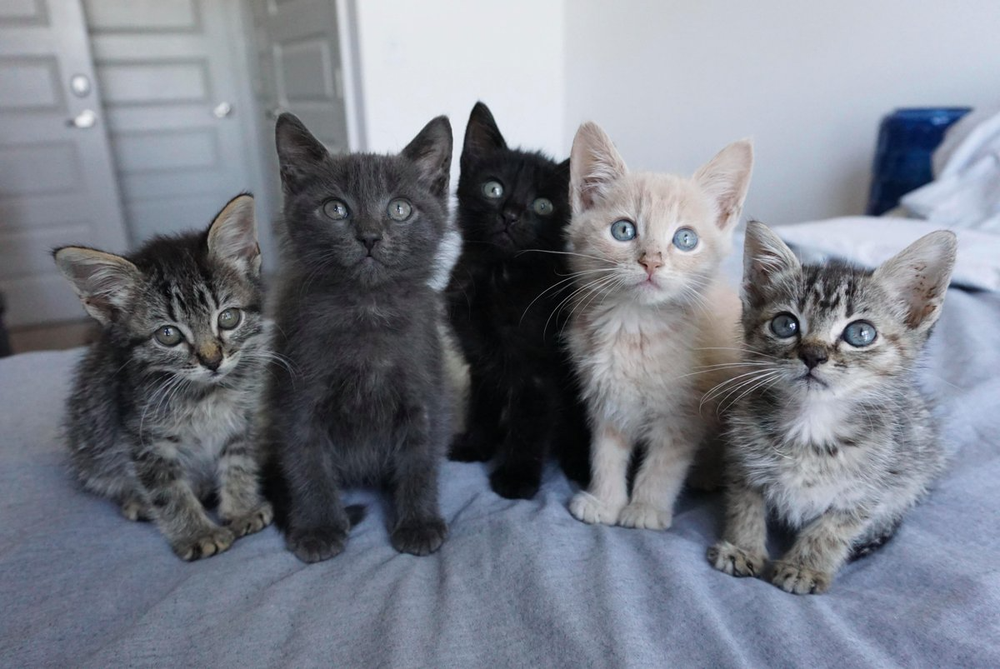

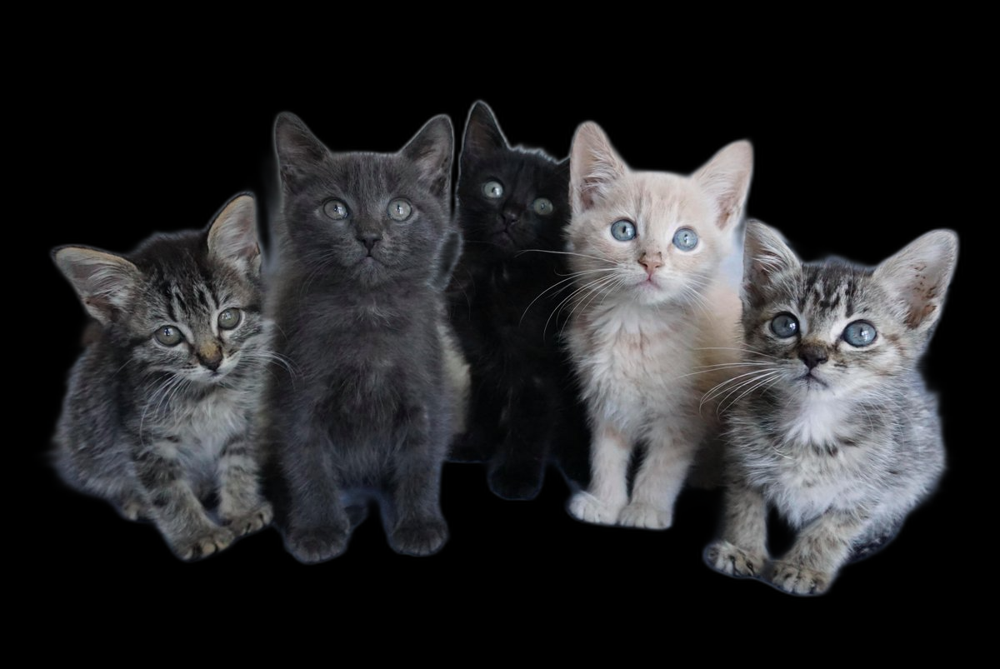

 The image segmentation and object Identification 


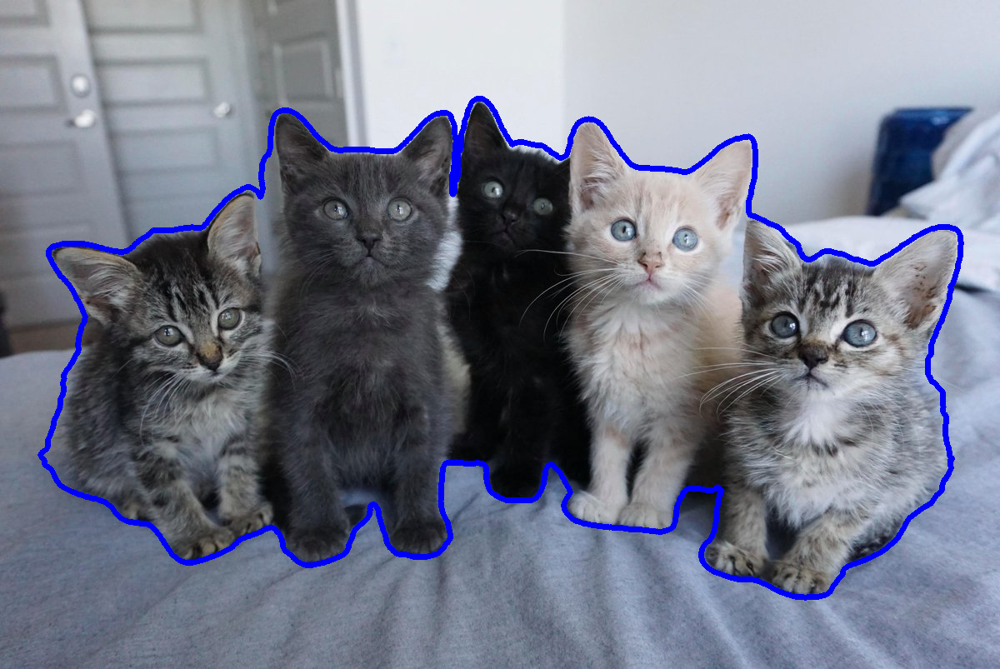

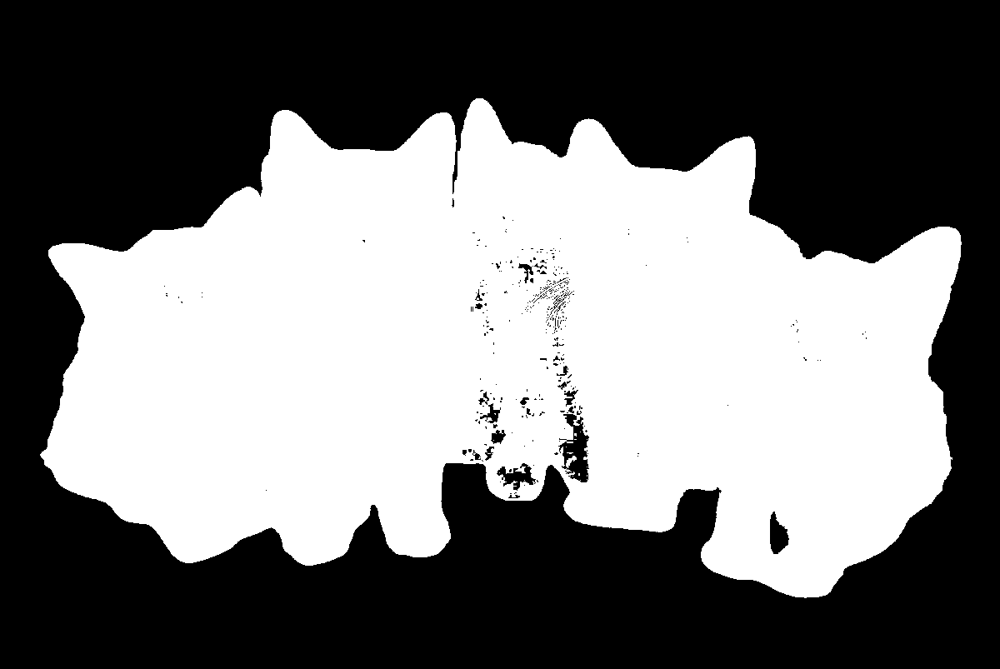

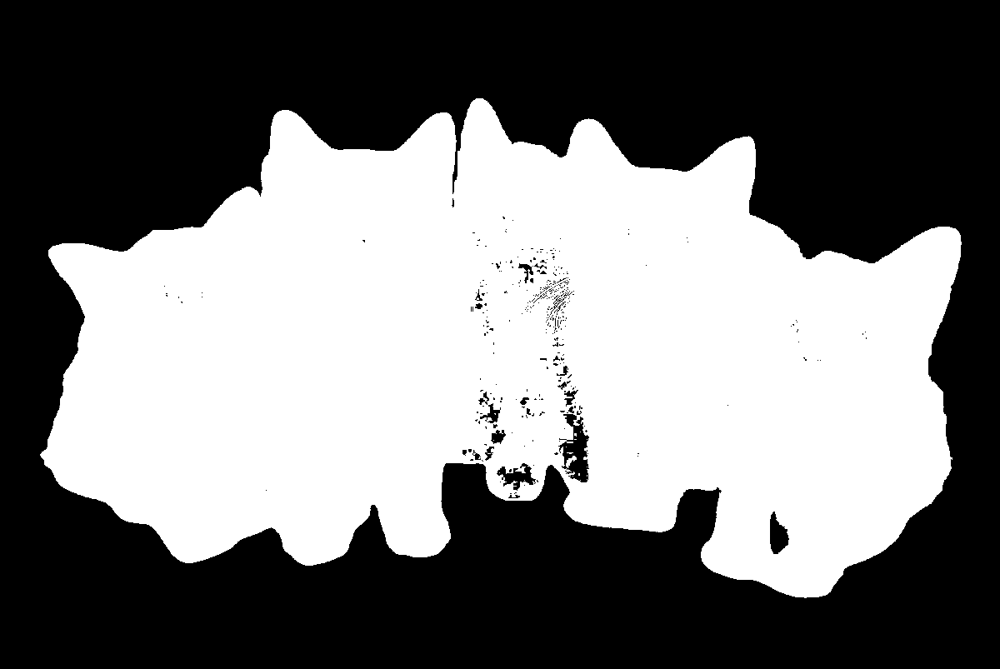

(803, 1200) (803, 1200, 3)
Image Background Seperation


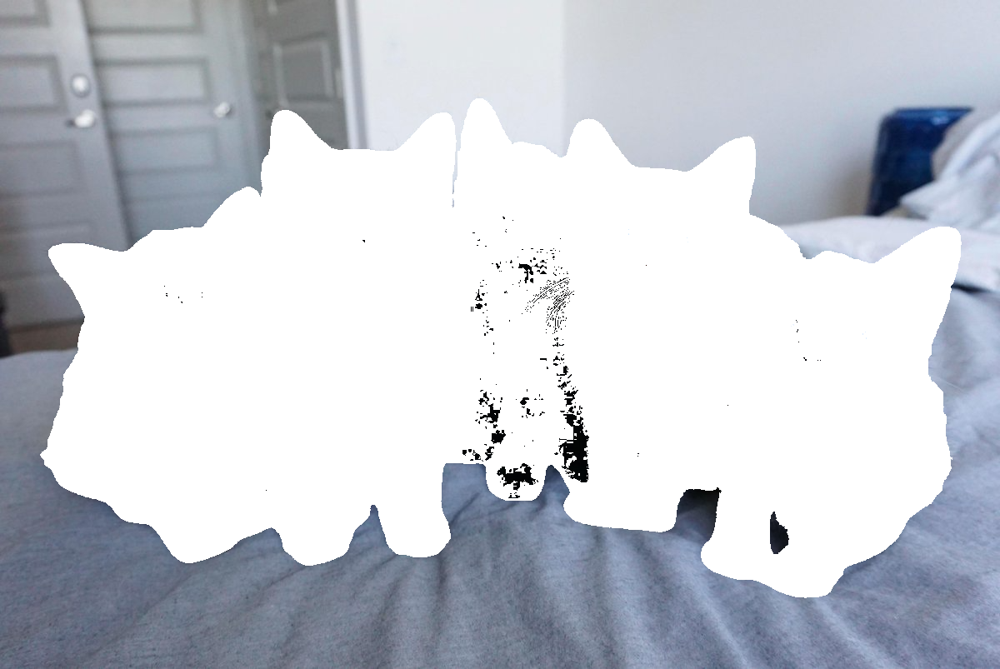

Image Foreground Seperation


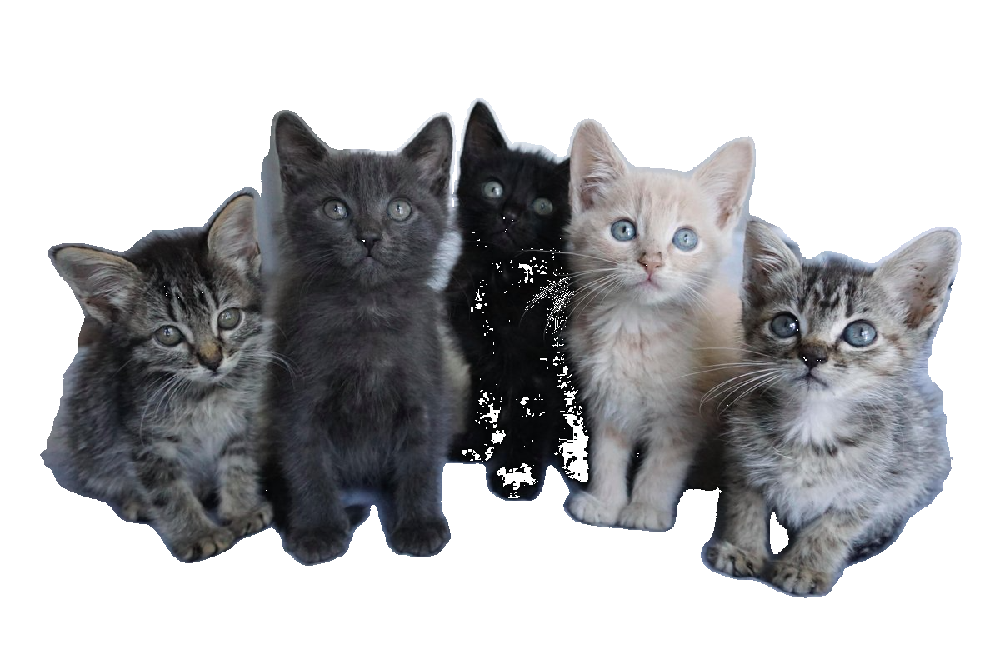

Image Background with green Filter


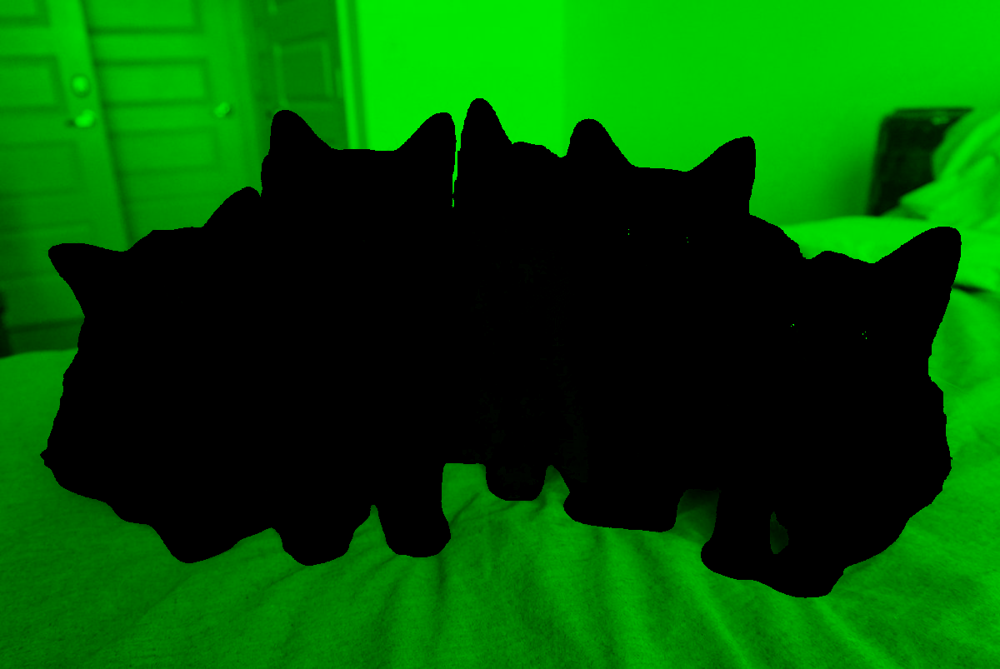

Image Background with red Filter


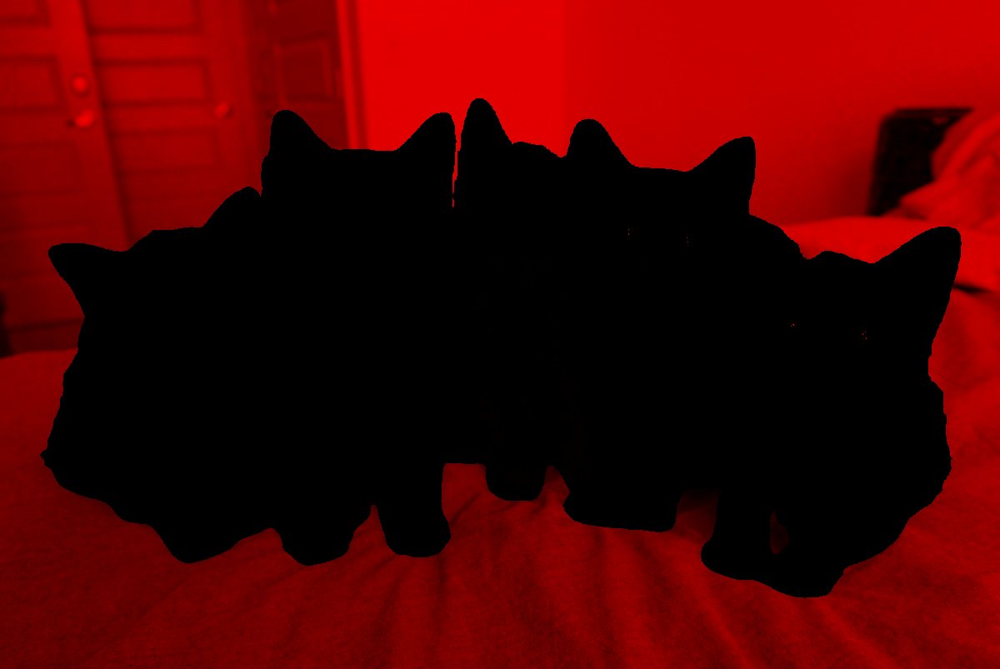

Image Foreground with green Filter


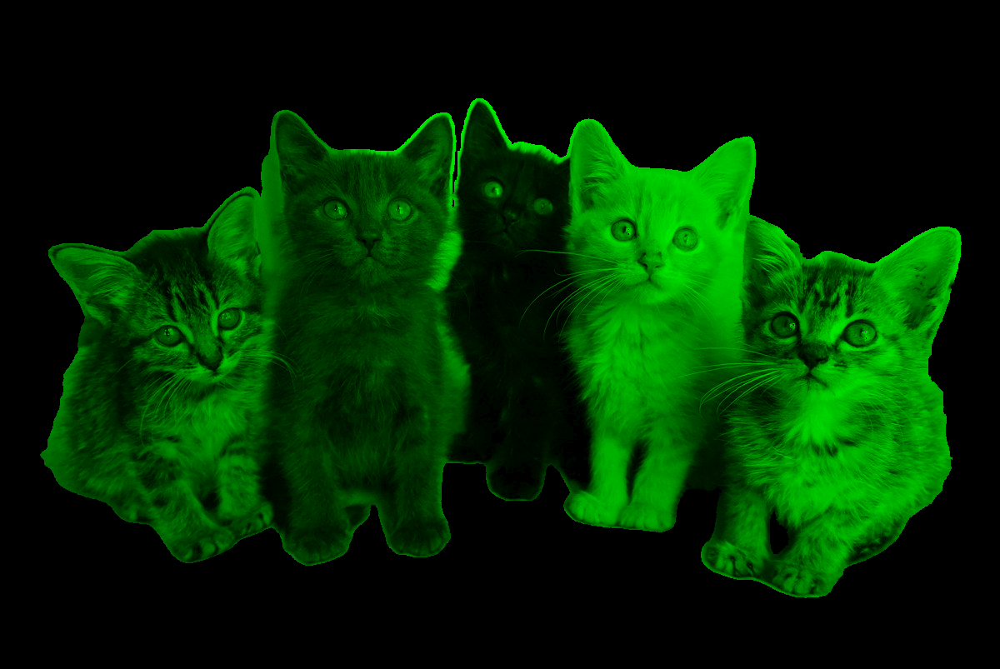

Image Foreground with red Filter


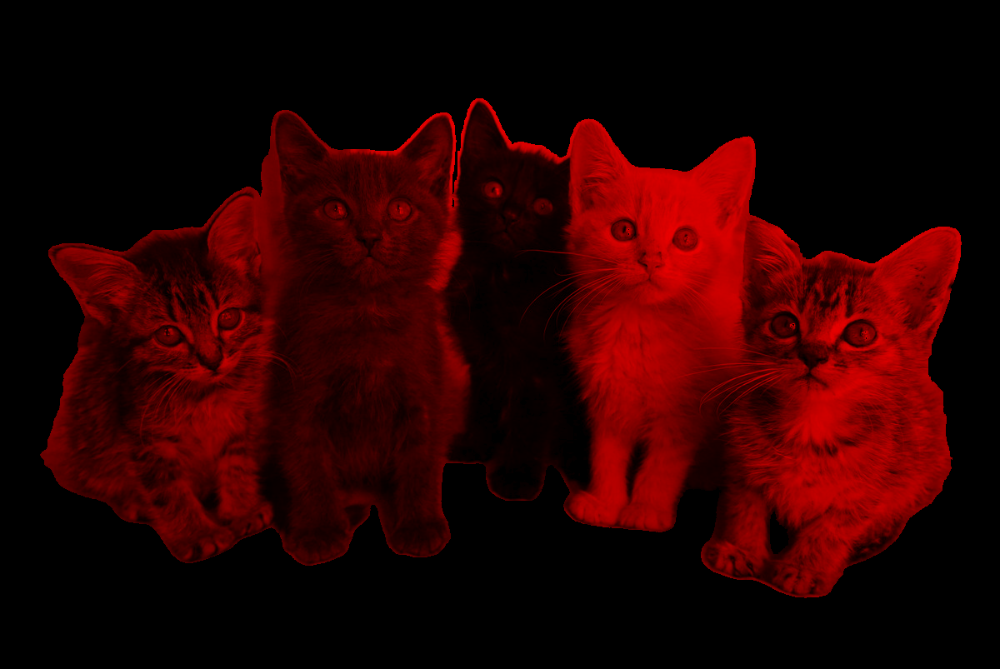

Foreground region(object 1) green and red filters are overlapped and moved by 4 pixels


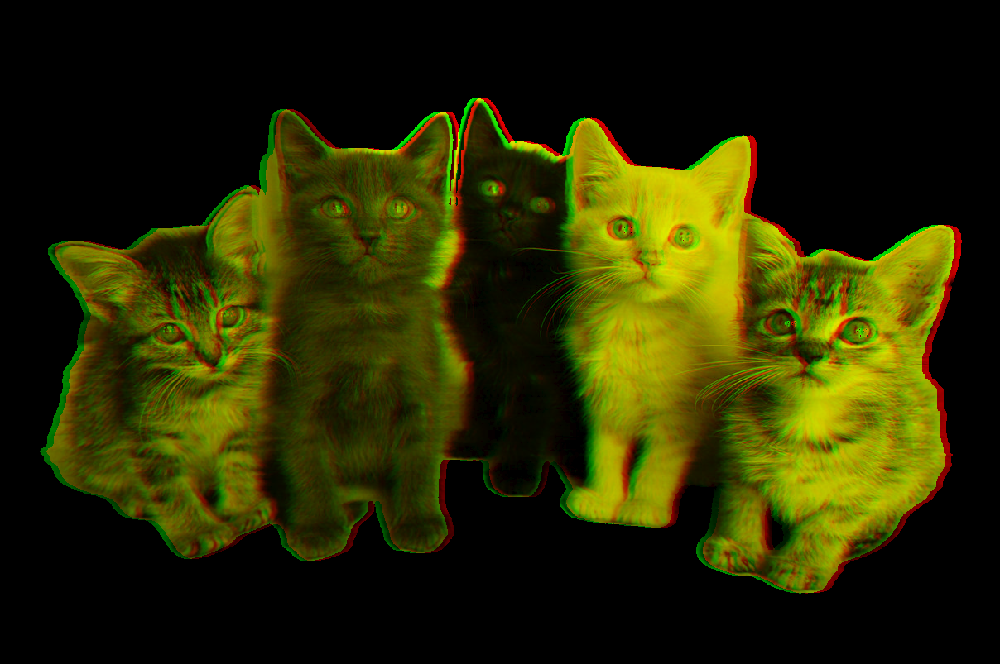

Background region(object 2) green and red filters are overlapped are moved by 2 pixels


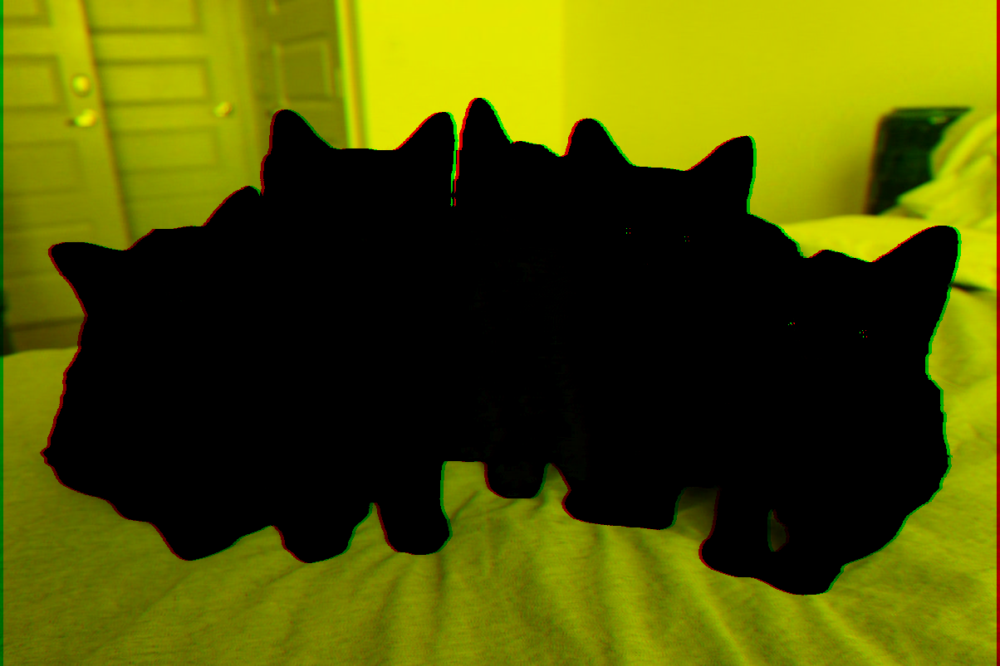

(803, 1204, 3) (803, 1208, 3)
Original Image


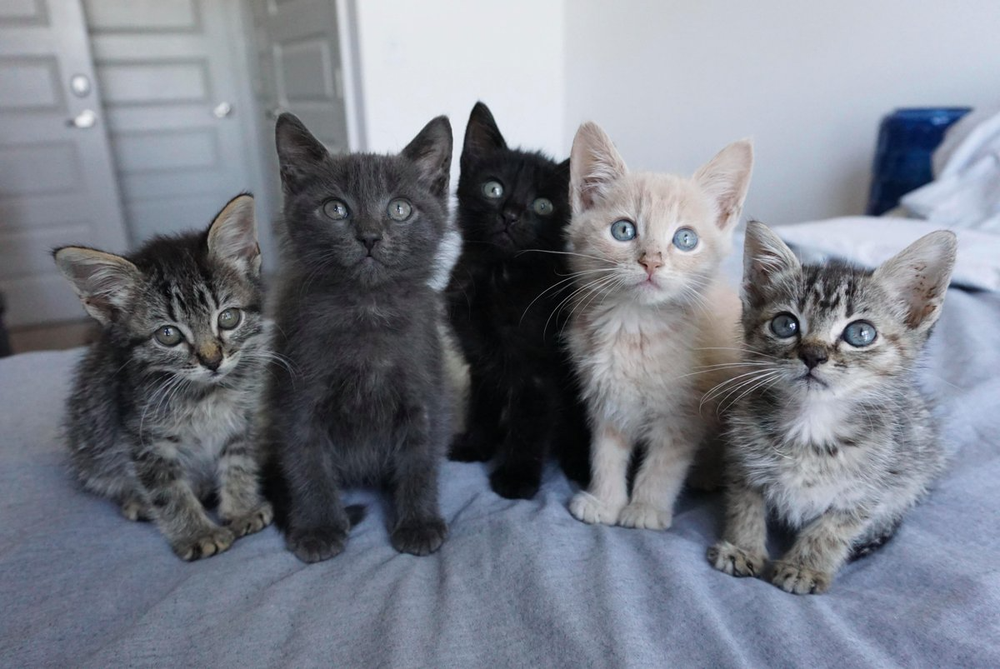

(803, 1208, 3) (803, 1208, 3)
Output 3D Image


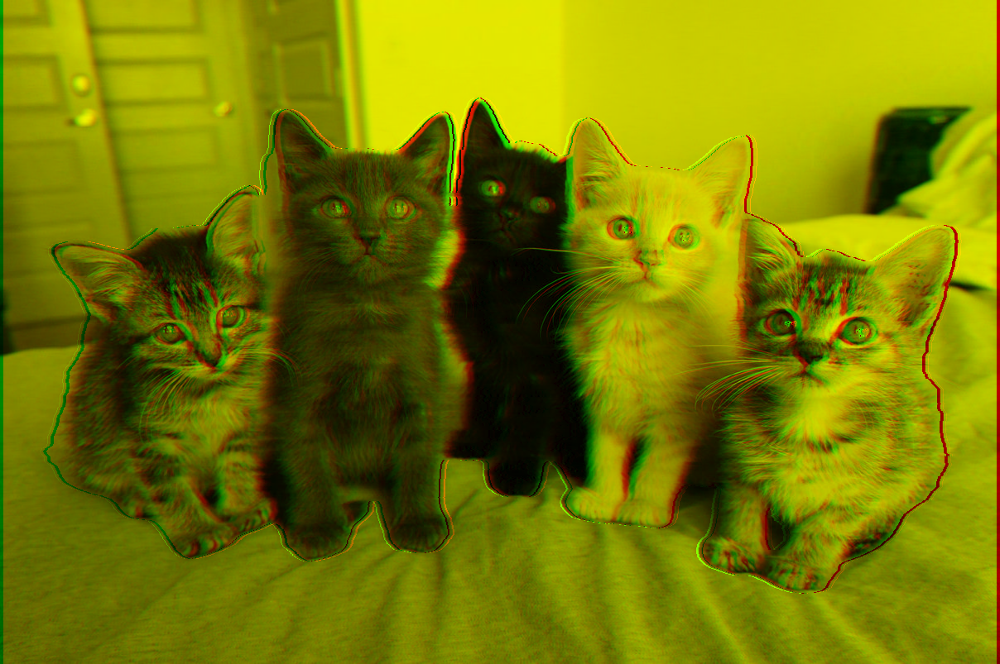

In [ ]:
file_input = "/content/image3.png"
file_output = "/content/image3_out.png"
img_detection(file_input,file_output)
segmented_image = cv2.imread("/content/image3_out.png")
Original_image = cv2.imread("/content/image3.png")
print("The IMAGE")
cv2_imshow(Original_image)
image_outline(segmented_image,Original_image,4,2)
